# Speech Recognition as Input to an LLM for task generation

#### References:
1. Speech Recognition with torchaudio https://docs.pytorch.org/audio/stable/tutorials/speech_recognition_pipeline_tutorial.html
2. ollama https://github.com/ollama/ollama-python

In [1]:
!pip list

Package                 Version
----------------------- -----------------
agno                    1.7.1
aiohappyeyeballs        2.6.1
aiohttp                 3.12.13
aiosignal               1.4.0
annotated-types         0.7.0
anyio                   4.9.0
asttokens               3.0.0
attrs                   25.3.0
Brotli                  1.1.0
certifi                 2025.6.15
cffi                    1.17.1
charset-normalizer      3.4.2
click                   8.2.1
colorama                0.4.6
comm                    0.2.2
contourpy               1.3.2
cycler                  0.12.1
datasets                3.6.0
debugpy                 1.8.14
decorator               5.2.1
dill                    0.3.8
distro                  1.9.0
docstring_parser        0.16
exceptiongroup          1.3.0
executing               2.2.0
filelock                3.18.0
fonttools               4.58.5
frozenlist              1.6.0
fsspec                  2025.3.0
gitdb                   4.0.12
GitPython  

In [2]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.7.1
2.7.1
cuda


In [3]:
import IPython
import matplotlib.pyplot as plt

SPEECH_FILE = "pbj.wav"
IPython.display.Audio(SPEECH_FILE)

See https://docs.pytorch.org/audio/stable/pipelines.html for pre-trained ASR models

In [25]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [16]:
model = bundle.get_model().to(device)

print(model.__class__)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_large_lv60k_asr_ls960.pth" to /home/patrickk/.cache/torch/hub/checkpoints/wav2vec2_fairseq_large_lv60k_asr_ls960.pth


100%|██████████| 1.18G/1.18G [00:47<00:00, 26.8MB/s]


<class 'torchaudio.pipelines._wav2vec2.utils._Wav2Vec2Model'>


In [17]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

In [18]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

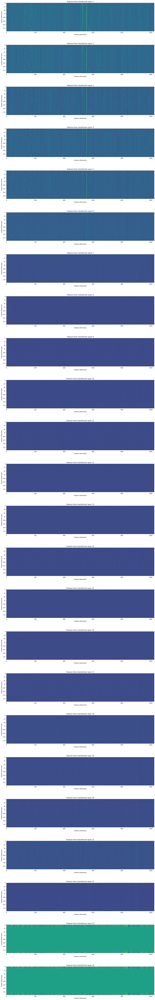

In [19]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


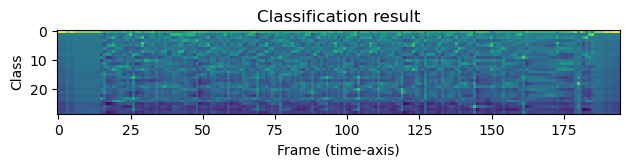

In [20]:
with torch.inference_mode():
    emission, _ = model(waveform)

plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [21]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [22]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [23]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

OL|CARY|T|TOSON|ECAN|PIN|BOTE|AN|JON|SAGE|


Decoder still has issue, likely need more fine-tuning of model.

### Pass through audio command to agent LLM

In [26]:
from textwrap import dedent
import ollama

# Initialize the Ollama client
client = ollama.Client()

In [27]:
# Generate a response based on a prompt
stream = ollama.chat(
    model='gemma3:4b',  # Replace 'llama2' with the model you pulled
    messages=[{'role': 'user', 'content': 'OK, tell me how to make a peanut butter jelly sandwich.'}], stream=True
    )

# Print the model's response
for chunk in stream:
    print(chunk['message']['content'], end='', flush=True)

Okay, let's make a classic peanut butter jelly sandwich! Here's a simple, step-by-step guide:

**What you'll need:**

*   2 slices of bread (your favorite kind!)
*   Peanut butter (smooth or crunchy – your choice!)
*   Jelly or jam (grape, strawberry, raspberry – whatever you like!)
*   A butter knife or spreader


**Instructions:**

1.  **Prepare the Bread:** Lay the two slices of bread on a clean surface, like a plate or cutting board.

2.  **Spread the Peanut Butter:** Open your jar of peanut butter. Using your butter knife, scoop out a generous amount of peanut butter. Spread it evenly over *one* slice of bread. Aim for a layer that's about 1/8 to 1/4 inch thick.  You can spread it edge to edge, or leave a little space.

3.  **Spread the Jelly:** Now open your jar of jelly. Using a *clean* butter knife (important to avoid mixing peanut butter into the jelly jar), scoop out a generous amount of jelly. Spread it evenly over the *other* slice of bread. Again, a layer of about 1/8 to 1